<a href="https://colab.research.google.com/github/Abrar171041075/Deep-Learning/blob/main/Image_Classification_using_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing kaggle dataset into drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.environ['KAGGLE_CONFIG_DIR']='/content/drive/MyDrive/kaggle_dataset'

In [3]:
%cd /content/drive/MyDrive/kaggle_dataset

/content/drive/MyDrive/kaggle_dataset


In [4]:
!ls

cat-and-dogs  kaggle.json


In [ ]:
!kaggle datasets download -d d4rklucif3r/cat-and-dogs

 95% 207M/218M [00:01<00:00, 123MB/s]
100% 218M/218M [00:02<00:00, 108MB/s]


Unzip files


In [ ]:
!mkdir cat-and-dogs
!mv cat-and-dogs.zip cat-and-dogs

mkdir: cannot create directory ‘cat-and-dogs’: File exists


In [5]:
%cd cat-and-dogs/

/content/drive/MyDrive/kaggle_dataset/cat-and-dogs


In [ ]:
!unzip cat-and-dogs.zip

Archive:  cat-and-dogs.zip
replace dataset/single_prediction/cat_or_dog_1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

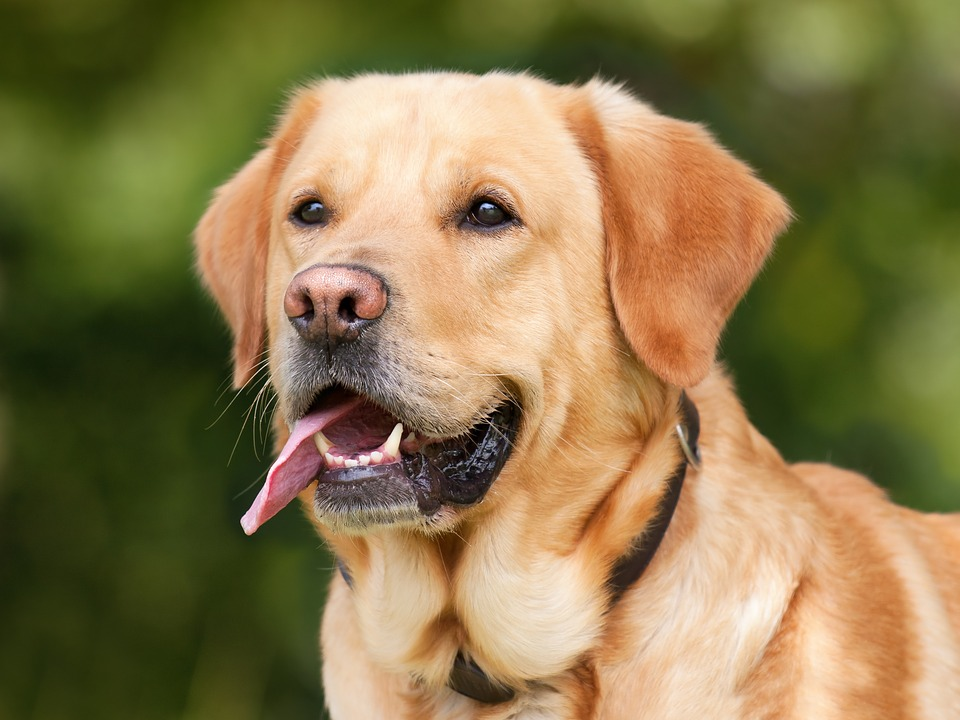

In [6]:
import cv2
from google.colab.patches import cv2_imshow
img = cv2.imread('/content/drive/MyDrive/kaggle_dataset/cat-and-dogs/dataset/single_prediction/cat_or_dog_1.jpg')
cv2_imshow(img)

#Importing libraries 

In [7]:
import numpy as np
import os
import pandas as pd

#Accuracy measurement
from sklearn.metrics import confusion_matrix
from sklearn.utils import shuffle


#Visualaization
import seaborn as sns
import matplotlib.pyplot as plt


#Model Module
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Activation, Flatten
from tensorflow.keras import backend as bk

from tensorflow.keras.optimizers import SGD, Adam, RMSprop, Adagrad, Adamax
from tensorflow.keras.models import Sequential

#TQDM is a progress bar library with good support for nested loops and Jupyter/IPython notebooks.
from tqdm import tqdm
import cv2

In [8]:
# 1. Augmentation
    # 1. Dynamic
    # 2. Static
# 2. Segmentation
# 3. Anotation

In [9]:
# # Overfitting
#     1.  EarlyStoping
#     2. Dropout
#     3. Regularization

In [10]:
classNames = ["cats", 'dogs']
classNameslabels = {classnames: i for i, classnames in enumerate(classNames)}
print(classNameslabels)
print(len(classNameslabels))

{'cats': 0, 'dogs': 1}
2


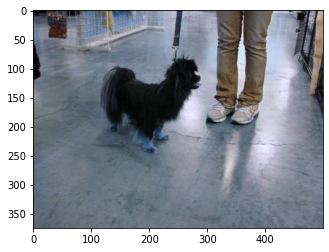

In [11]:
imageData = cv2.imread ('/content/drive/MyDrive/kaggle_dataset/cat-and-dogs/dataset/training_set/dogs/dog.1000.jpg')
plt.imshow(imageData)
plt.show()

In [12]:
#H/W -- Split the file name and extract the class names 


file_name ="image_data_cnn/dataset/training_set/dogs/dog.20.jpg" 

print("To call only the file name:",'\n', file_name.split('/')[4]) 

print("Only the respective class of image:", '\n', file_name.split('/')[4].split('.')[0])

To call only the file name: 
 dog.20.jpg
Only the respective class of image: 
 dog


In [13]:
imageData.shape

(375, 499, 3)

In [14]:
image_shape = (128,128)

In [15]:
def datasetLoaderFromDirectory():
    #Load datasets from folder
    dataset_path = ["dataset/training_set/", "dataset/test_set/"]
    #Store data into the list with their paths
    imagedataOutput = []
    # Tag each data path file
    for i in dataset_path:
        #List for image data
        images = []
        #list for class names
        labels = []
        print("Counting : {}".format(i))

            
        for j in os.listdir(i):  #training & test images access 
            label = classNameslabels[j]
            for imagedatafile in tqdm(os.listdir(os.path.join(i, j))): #joining training set wit images
                
                imagePath = os.path.join(os.path.join(i, j), imagedatafile)
                
                #image Read & Preprocessing
                image = cv2.imread(imagePath)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, image_shape)
                
                #print("Images: ", image)
                
                images.append(image)
                labels.append(label)

        images = np.array(images, dtype = "float32")
        labels = np.array(labels, dtype = 'float32')
        #print(images)
        imagedataOutput.append((images, labels))
    
    return imagedataOutput

In [16]:
#(train_image, train_labesl), (test_image, test_labels) = shuffle(datasetLoaderFromDirectory())
# never shuffle test data

In [17]:
(train_image, train_labels), (test_image, test_labels) = datasetLoaderFromDirectory()

Counting : dataset/training_set/


100%|██████████| 4000/4000 [01:12<00:00, 55.27it/s] 


Counting : dataset/test_set/


100%|██████████| 1000/1000 [00:19<00:00, 50.30it/s]


In [18]:
train_images, train_labels = shuffle(train_image, train_labels, random_state = 26)

In [20]:
print(train_image.shape)
print(train_labels.shape)
print(test_image.shape)
print(test_labels.shape)

(8000, 128, 128, 3)
(8000,)
(2000, 128, 128, 3)
(2000,)


In [21]:
# _, symbol means value referencing

In [22]:
train_labels

array([1., 1., 1., ..., 1., 1., 1.], dtype=float32)

In [23]:
_, trainImageLabelInfo = np.unique(train_labels, return_counts=True)
_, testImageLabelInfo = np.unique(test_labels, return_counts = True)

In [24]:
print("Train Image Label information for 0 Class: ", trainImageLabelInfo[0])
print("Train Image Label information for 1 Class: ", trainImageLabelInfo[1])

print("---------------------------------------------------")

print("Test Image Label information for 0 Class: ", testImageLabelInfo[0])
print("Test Image Label information for 1 Class: ", testImageLabelInfo[1])

Train Image Label information for 0 Class:  4000
Train Image Label information for 1 Class:  4000
---------------------------------------------------
Test Image Label information for 0 Class:  1000
Test Image Label information for 1 Class:  1000


In [25]:
# Creating Dataframe for stroing image labels metadata
# Using Dictionary concept
pd.DataFrame({"Train":trainImageLabelInfo,
            "Test": testImageLabelInfo}, 
             index = classNames
            )

,Train,Test
cats,4000,1000
dogs,4000,1000


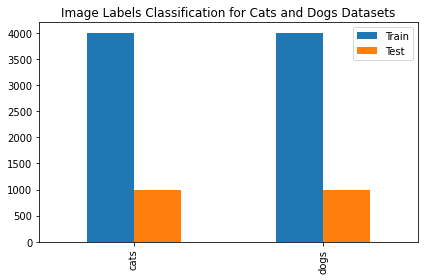

In [26]:
# Creating Dataframe for stroing image labels metadata
# Using Dictionary concept

pd.DataFrame({"Train":trainImageLabelInfo,
            "Test": testImageLabelInfo}, 
             index = classNames
            ).plot.bar()

plt.title("Image Labels Classification for Cats and Dogs Datasets")
plt.grid(False)
plt.tight_layout() #bring visualization in a standard pattern
plt.show()

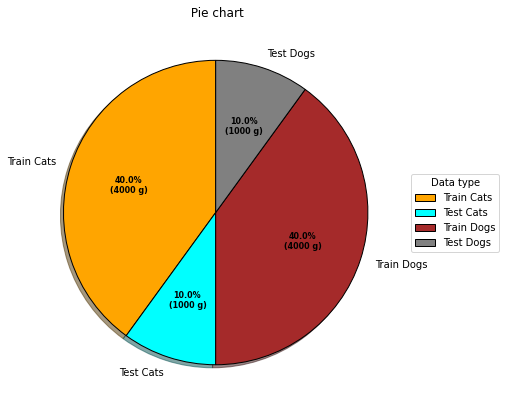

In [27]:
from matplotlib import pyplot as plt
import numpy as np
 
 
# Creating dataset
DATA = ['Train Cats', 'Test Cats', 'Train Dogs',
        'Test Dogs']
 
data = [4000, 1000, 4000, 1000]

# Creating color parameters
colors = ( "orange", "cyan", "brown",
          "grey")
 
# Wedge properties
wp = { 'linewidth' : 1, 'edgecolor' : "black" }
 
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d} g)".format(pct, absolute)
 
# Creating plot
fig, ax = plt.subplots(figsize =(10, 7))
wedges, texts, autotexts = ax.pie(data,
                                  autopct = lambda pct: func(pct, data),
                                  labels = DATA,
                                  shadow = True,
                                  colors = colors,
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color ="black"))
 
# Adding legend
ax.legend(wedges, DATA,
          title ="Data type",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))
 
plt.setp(autotexts, size = 8, weight ="bold")
ax.set_title(" Pie chart")
 
# show plot
plt.show()
 


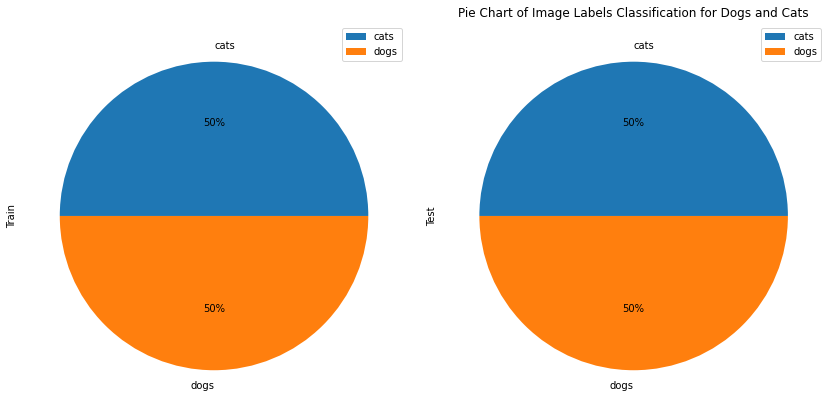

In [36]:
from IPython.core.pylabtools import figsize

pd.DataFrame({"Train": trainImageLabelInfo,
              "Test": trainImageLabelInfo},
               index = classNames).plot.pie(subplots=True,figsize=(12,8),  autopct='%1.0f%%')
plt.title("Pie Chart of Image Labels Classification for Dogs and Cats")
plt.tight_layout()
plt.show()


In [38]:
# Read one image features
imageFeature = train_images[0] # Image feature value should be in range between [0, 255]
#np.unique(imageFeature)
len(np.unique(imageFeature))

256

In [39]:
# Scaleing image featues 
train_images = train_images/255.0
test_image = test_image/255.0

In [40]:
train_images[0]
np.unique(train_images[0])
#len(np.unique(train_images[0])) len is same without scaling

array([0.        , 0.00392157, 0.00784314, 0.01176471, 0.01568628,
       0.01960784, 0.02352941, 0.02745098, 0.03137255, 0.03529412,
       0.03921569, 0.04313726, 0.04705882, 0.05098039, 0.05490196,
       0.05882353, 0.0627451 , 0.06666667, 0.07058824, 0.07450981,
       0.07843138, 0.08235294, 0.08627451, 0.09019608, 0.09411765,
       0.09803922, 0.10196079, 0.10588235, 0.10980392, 0.11372549,
       0.11764706, 0.12156863, 0.1254902 , 0.12941177, 0.13333334,
       0.13725491, 0.14117648, 0.14509805, 0.14901961, 0.15294118,
       0.15686275, 0.16078432, 0.16470589, 0.16862746, 0.17254902,
       0.1764706 , 0.18039216, 0.18431373, 0.1882353 , 0.19215687,
       0.19607843, 0.2       , 0.20392157, 0.20784314, 0.21176471,
       0.21568628, 0.21960784, 0.22352941, 0.22745098, 0.23137255,
       0.23529412, 0.23921569, 0.24313726, 0.24705882, 0.2509804 ,
       0.25490198, 0.25882354, 0.2627451 , 0.26666668, 0.27058825,
       0.27450982, 0.2784314 , 0.28235295, 0.28627452, 0.29019

In [41]:
#train_images.shape[0]
np.random.randint(train_images.shape[0])
#train_images.shape # (8000, 128, 128, 3) --> (Number of Image, Image_W, Image_H, Number of Color channle)

3711

In [42]:
train_labels[345]

0.0

In [43]:
print(type(train_labels)) #cannot pass numpy array as label, it must be integer value

<class 'numpy.ndarray'>


In [69]:
# # Now Read an image after Scalling
def ImageVisualization(classNames, imagePath, imagelabel):
    #Create an index for indivudual Image
    index = np.random.randint(imagePath.shape[0]) # Index always int , .shape[0] randomly generating index
    #print(type(index))

    plt.figure()# Define Frame size
    plt.imshow(imagePath[index])
    
    plt.xticks([]) #label wise output visualize in the target
    plt.yticks([])
    plt.grid(False)
    plt.tight_layout()
    
    plt.title("Index of this Image is: {}".format(index) + " and Class is : " + classNames[int(imagelabel[index])]) #img label must be int
    plt.show()

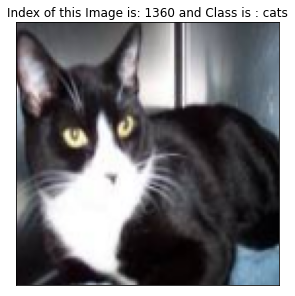

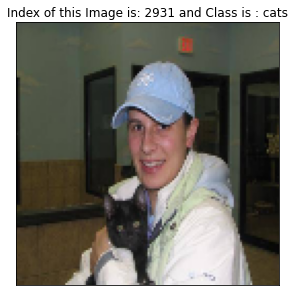

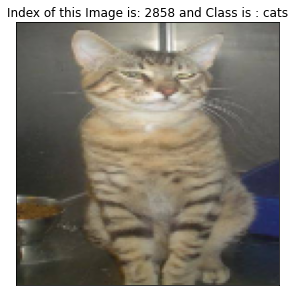

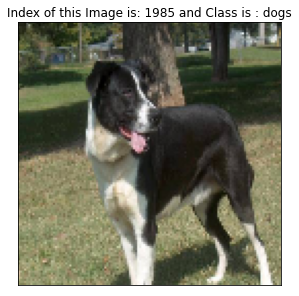

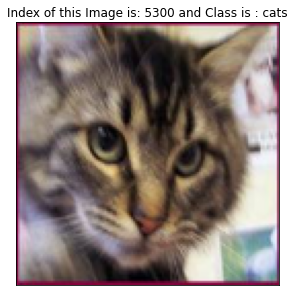

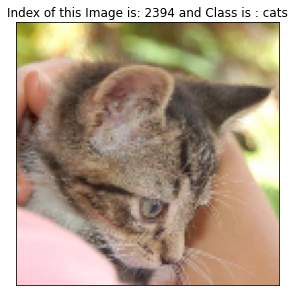

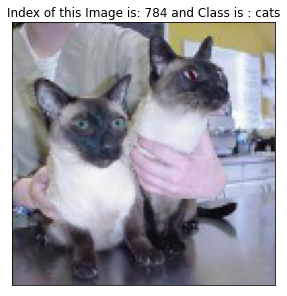

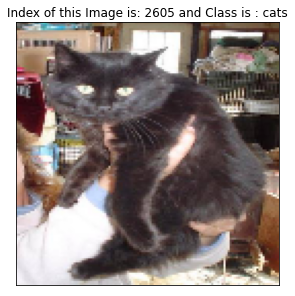

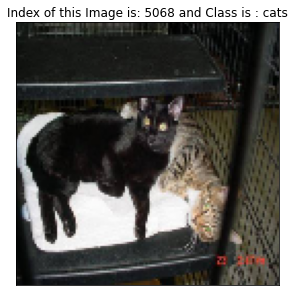

In [70]:
# Home Work: + and Actual is Class Names

for i in range(1, 10):
    ImageVisualization(classNames, train_images, train_labels)

In [88]:
def ImageVisualization1(classNames, imagePath, imagelabel,actuallabel):
    #Create an index for indivudual Image
    index = np.random.randint(imagePath.shape[0]) # Index always int , .shape[0] randomly generating index
    #print(type(index))

    plt.figure()# Define Frame size
    plt.imshow(imagePath[index])
    
    plt.xticks([]) #label wise output visualize in the target
    plt.yticks([])
    plt.grid(False)
    plt.tight_layout()
    
    plt.title("Index of this Image is: {}".format(index) + " and Class is : " + classNames[int(imagelabel[index])] + ". Actual  is: " + classNames[int(actuallabel[index])]) #img label must be int
    plt.show()

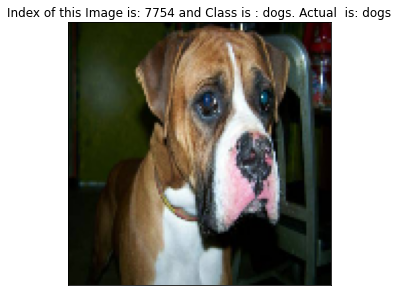

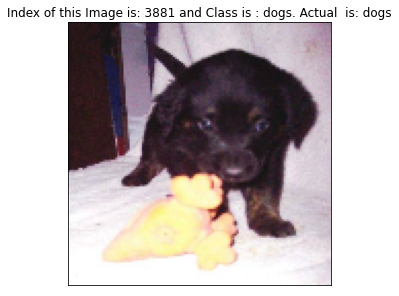

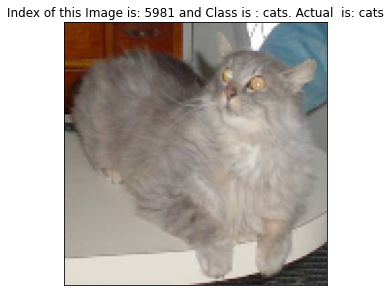

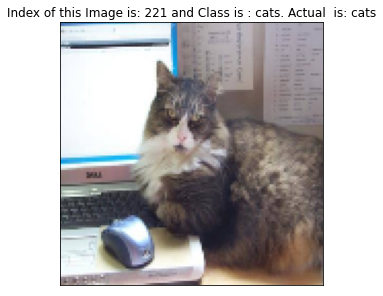

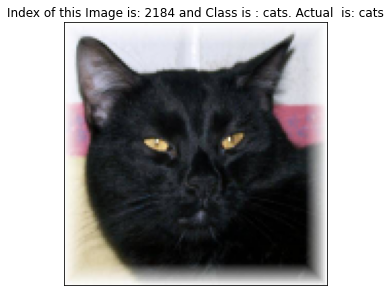

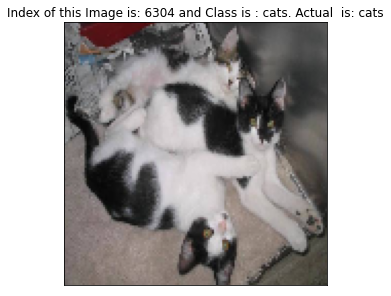

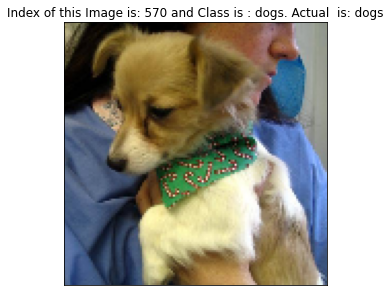

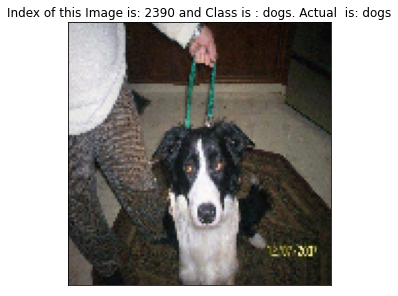

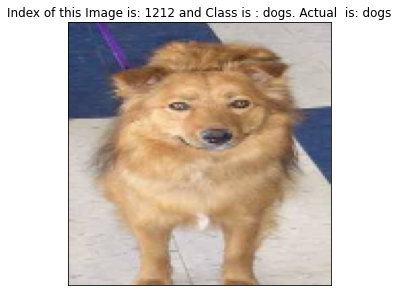

In [89]:
# Home Work: + and Actual is Class Names

for i in range(1, 10):
    ImageVisualization1(classNames, train_images, train_labels, train_labels)

In [73]:
def ImageVisualization2(classNames, imagePath, imagelabel):
    
    fig = plt.figure(figsize=(10, 10))
    fig.suptitle("Random Image Visualization", fontsize = 20 )
    
    for i in range(25):
        plt.subplot(5, 5, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.tight_layout()
        
        plt.imshow(imagePath[i], cmap = plt.cm.binary)
        plt.xlabel("Class Names: {}".format(classNames[int(imagelabel[i])]))
    plt.show()

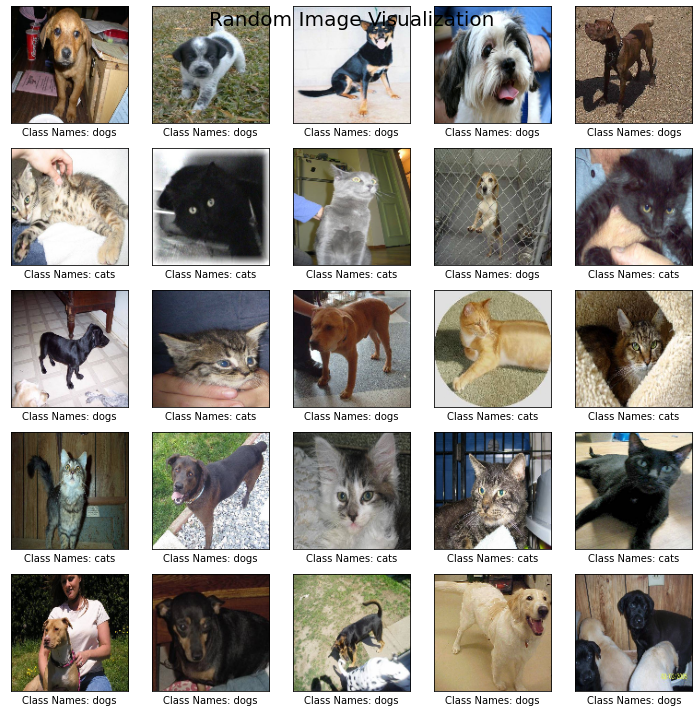

In [74]:
ImageVisualization2(classNames, train_images, train_labels)

In [50]:
# Home Work: Visualize Image at shape of (3, 3)
# Now Read an image after Scalling
def ImageVisualization2(classNames, imagePath, imagelabel):
    
    fig = plt.figure(figsize=(10, 10))
    fig.suptitle("Random Image Visualization", fontsize = 20 )
    
    for i in range(9):
        plt.subplot(3, 3, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.tight_layout()
        
        plt.imshow(imagePath[i], cmap = plt.cm.binary)
        plt.xlabel("Class Names: {}".format(classNames[int(imagelabel[i])]))
    plt.show()

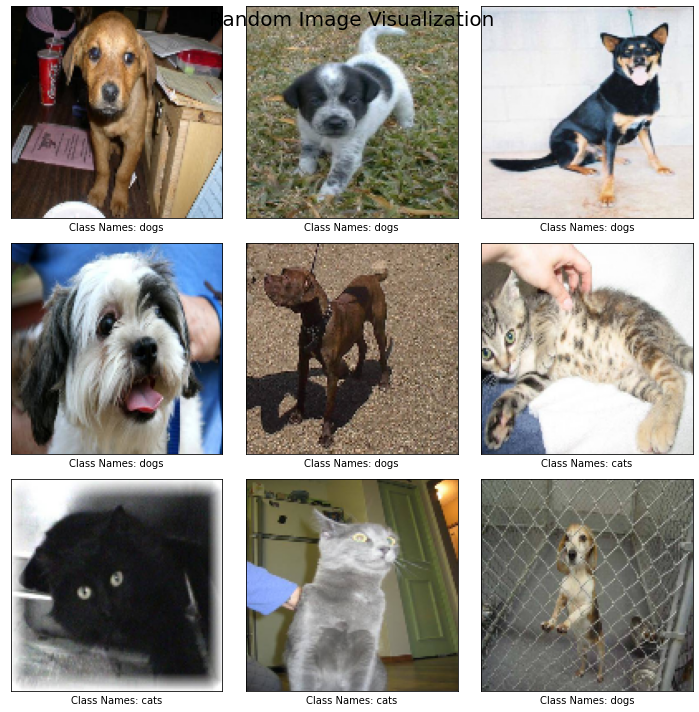

In [51]:
ImageVisualization2(classNames, train_images, train_labels)

In [54]:
 train_images.shape

(8000, 128, 128, 3)

Model Create from scratch

In [55]:
model = Sequential([
    
    # Input Layer
    
    Conv2D(32, kernel_size=(3, 3), activation = "relu", input_shape = (128, 128, 3)),
    MaxPooling2D(2, 2), #many parameters are missing stride,padding....
    
    #1st Hidden Layer

    Conv2D(64, kernel_size=(3, 3), activation = "relu"),
    MaxPooling2D(2, 2),
    
     #2nd Hidden Layer
    
    Conv2D(128, kernel_size=(3, 3), activation = "relu"),
    MaxPooling2D(2, 2),
    #3rd Hidden Layer
    
    Conv2D(256, kernel_size=(3, 3), activation = "relu"),
    MaxPooling2D(2, 2),
    #4th Hidden Layer

    Conv2D(512, kernel_size=(3, 3), activation = "relu"),
    MaxPooling2D(2, 2),

    Flatten(),
    
    # Connected Layer
    
    Dense(512, activation = "relu"),
    Dense(2, activation = "softmax")
])

In [56]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 128)      0

Three important parameters to compile (Optimizer, loss, accuracy)

Adam = most commonly used, perform well for all models and safest

Loss = sparse_categorical_crossentropy for softmax is better and for sigmoid, binary_crossentropy/categorial_crossentropy

In [57]:
model.compile(optimizer = 'adam',
             loss = "sparse_categorical_crossentropy",
             metrics = ['accuracy'])

batch size (128 is magic number) is number of segment, validation split (0,2 is magic value)is train test data split ratio, epochs is

In [58]:
modelData = model.fit(train_images,
                     train_labels,
                      epochs = 10,
                     batch_size = 128,
                     validation_split=0.2)

Epoch 1/10
50/50 [==============================] - 218s 4s/step - loss: 0.6925 - accuracy: 0.5298 - val_loss: 0.6752 - val_accuracy: 0.5631
Epoch 2/10
50/50 [==============================] - 217s 4s/step - loss: 0.6402 - accuracy: 0.6277 - val_loss: 0.6093 - val_accuracy: 0.6687
Epoch 3/10
50/50 [==============================] - 219s 4s/step - loss: 0.6005 - accuracy: 0.6794 - val_loss: 0.5643 - val_accuracy: 0.7025
Epoch 4/10
50/50 [==============================] - 231s 5s/step - loss: 0.5522 - accuracy: 0.7194 - val_loss: 0.5249 - val_accuracy: 0.7437
Epoch 5/10
50/50 [==============================] - 219s 4s/step - loss: 0.4902 - accuracy: 0.7670 - val_loss: 0.4850 - val_accuracy: 0.7619
Epoch 6/10
50/50 [==============================] - 216s 4s/step - loss: 0.4361 - accuracy: 0.8003 - val_loss: 0.4400 - val_accuracy: 0.7956
Epoch 7/10
50/50 [==============================] - 228s 5s/step - loss: 0.3792 - accuracy: 0.8275 - val_loss: 0.4203 - val_accuracy: 0.8069
Epoch 8/10
50

accuracy = actual,
val_accuracy = predicted

In [60]:
def accuracy_and_loss_Plot(modelData):
    
    fig = plt.figure(figsize = (10, 10))
    
    plt.subplot(2,2,1) #row=2 column=2 , 1st row 1st column = 221
    plt.plot(modelData.history["accuracy"], 'bo--', label = 'accuracy')
    plt.plot(modelData.history["val_accuracy"], 'ro--', label = 'val_accuracy')
    plt.title("Training Data Accuracy Measurement")
    plt.xlabel("Number of Epochs")
    plt.ylabel("Accuracy Information")
    plt.grid()
    plt.legend()
    plt.tight_layout()
    
    
    
    plt.subplot(2,2,2) #row=2 column=2 , 2nd row 2nd column = 221
    plt.plot(modelData.history["loss"], 'bo--', label = 'loss')
    plt.plot(modelData.history["val_loss"], 'ro--', label = 'val_loss')
    plt.title("Training Data Loss Measurement")
    plt.xlabel("Number of Epochs")
    plt.ylabel("Loss Information")
    plt.grid()
    plt.legend()
    plt.tight_layout()
    
    plt.show()

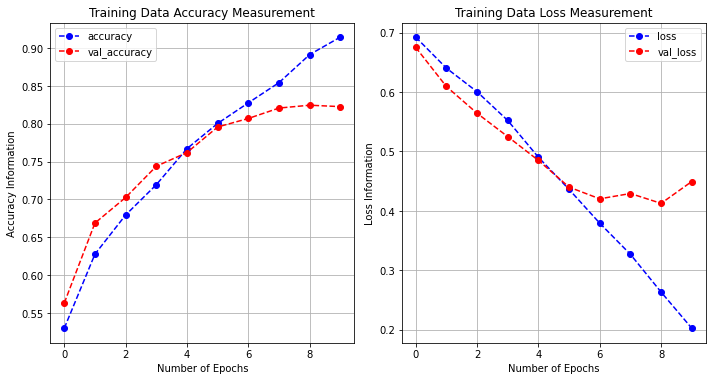

In [61]:
accuracy_and_loss_Plot(modelData)

In [75]:
testLoss = model.evaluate(test_image, test_labels)

63/63 [==============================] - 17s 263ms/step - loss: 0.4793 - accuracy: 0.8105


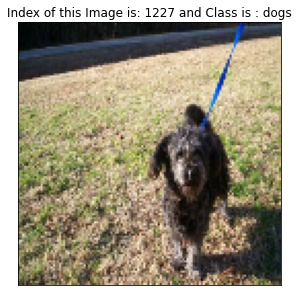

In [76]:
predictedData = model.predict(test_image)
predictedDataLabels = np.argmax(predictedData, axis = 1) #argmax is taking maximum prediction value
ImageVisualization(classNames, test_image, predictedDataLabels)

Scatter format visualization (Image prediction)

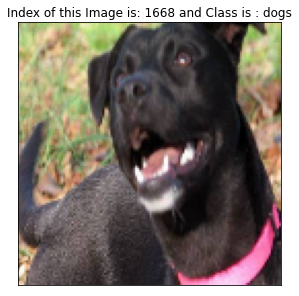

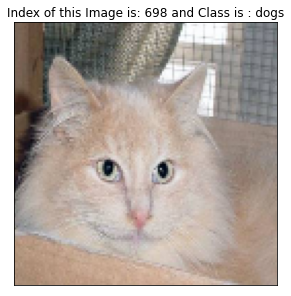

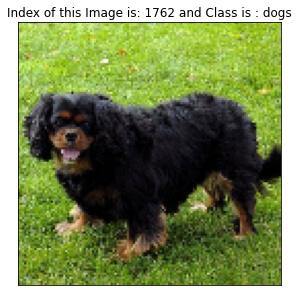

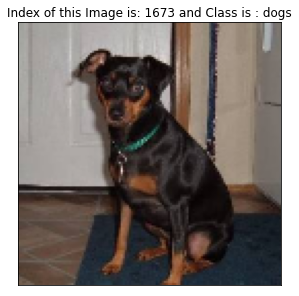

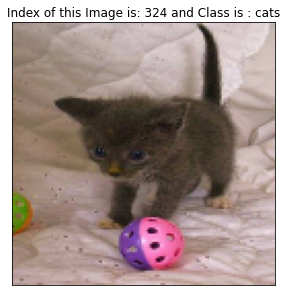

...

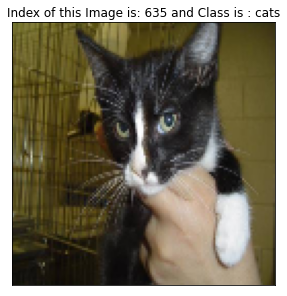

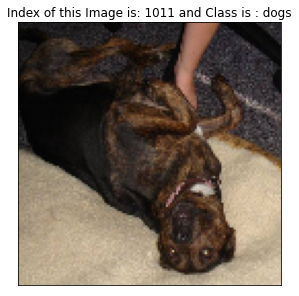

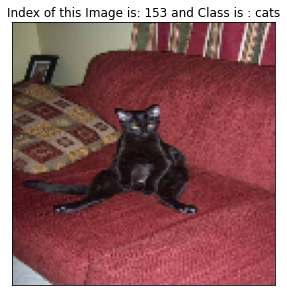

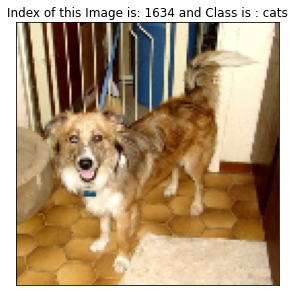

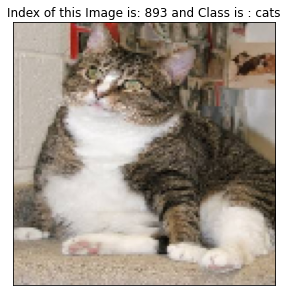

In [79]:
for  i in range(1,25):
  ImageVisualization(classNames, test_image, predictedDataLabels)

In [86]:
def missclassification(classNames, imagePath, imagelabel):
    
    fig = plt.figure(figsize=(10, 10))
    #fig.suptitle("Random Image Visualization", fontsize = 20 )
    
    for i in range(9):
        plt.subplot(3, 3, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.tight_layout()
        
        plt.imshow(imagePath[i], cmap = plt.cm.binary)
        plt.xlabel("Class Names: {}".format(classNames[int(imagelabel[i])]))
    plt.show()

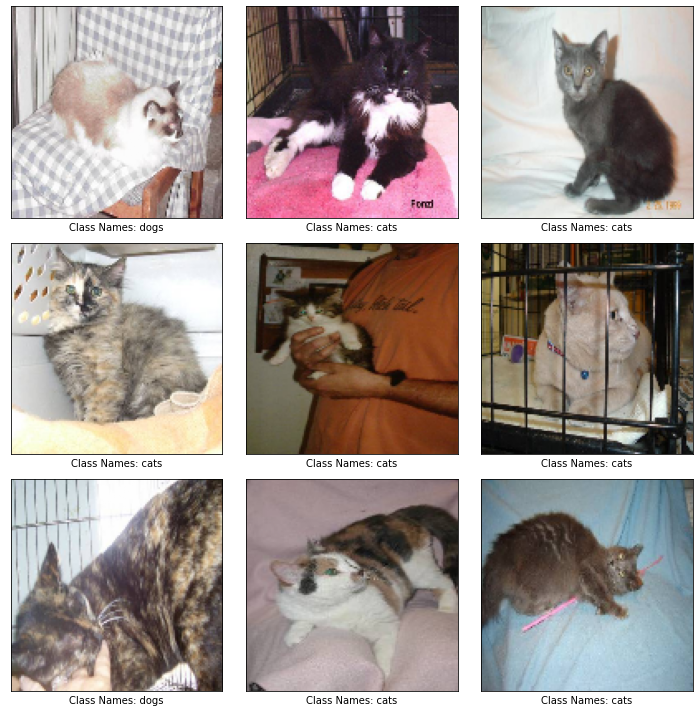

In [87]:
missclassification(classNames, test_image, predictedDataLabels)

# Compare Pridected and Actual Class Name

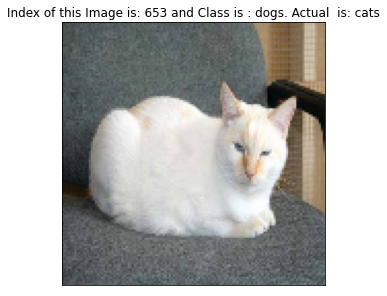

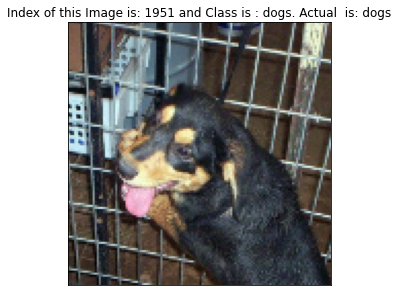

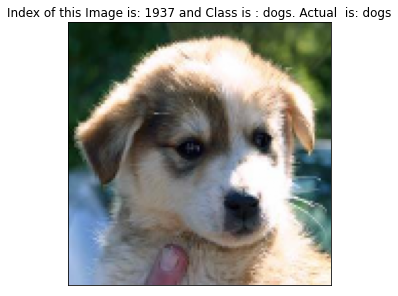

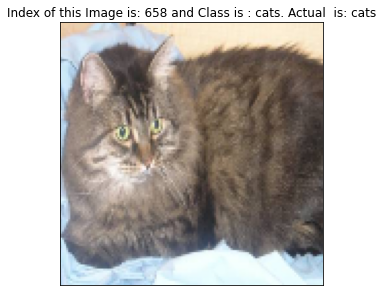

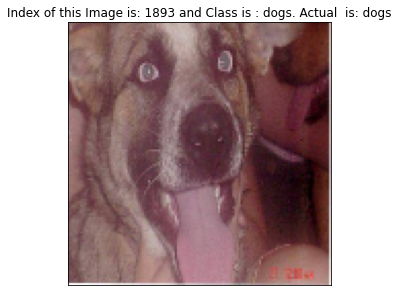

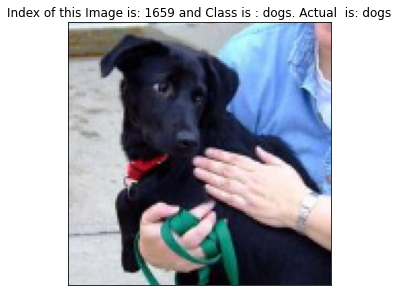

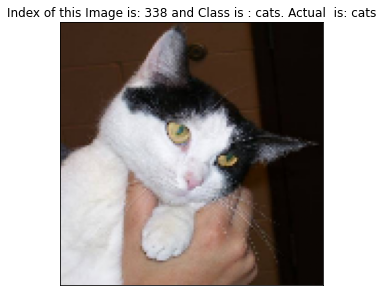

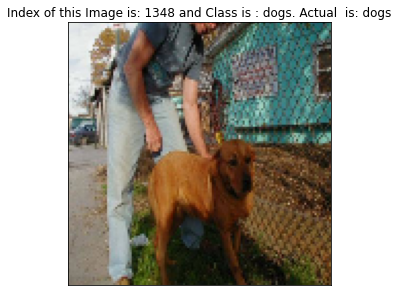

In [91]:
for i in range(11,19):
  ImageVisualization1(classNames, test_image, predictedDataLabels,test_labels)

In [95]:
def missclassification1(classNames, imagePath, imagelabel, actuallabel):
    
    fig = plt.figure(figsize=(10, 10))
    #fig.suptitle("Random Image Visualization", fontsize = 20 )
    
    for i in range(9):
        plt.subplot(3, 3, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.tight_layout()
        
        plt.imshow(imagePath[i], cmap = plt.cm.binary)
        plt.xlabel("Class Names: {}".format(classNames[int(imagelabel[i])]) + "Actual Class Names: {}".format(classNames[int(actuallabel[i])]) )
    plt.show()

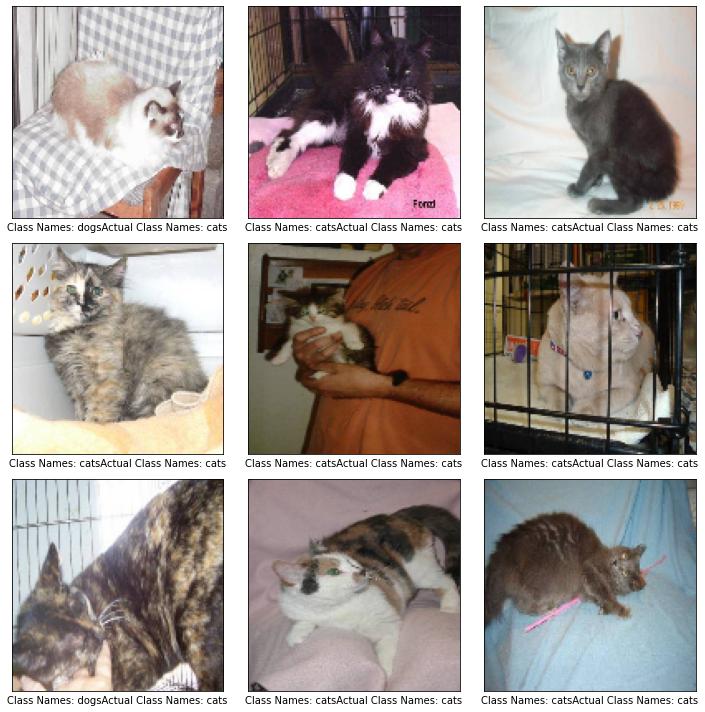

In [96]:
missclassification1(classNames, test_image, predictedDataLabels,test_labels)

# Accuracy measure

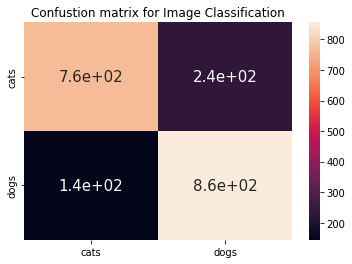

In [94]:
cm = confusion_matrix(test_labels, predictedDataLabels)
ax = plt.axes()
sns.heatmap(cm, annot =True,
            annot_kws={'size':15}, 
           xticklabels=classNames,
           yticklabels=classNames, 
           ax = ax)

plt.title("Confustion matrix for Image Classification")
plt.show()

In [105]:
tp,fp,fn,tn = confusion_matrix(test_labels, predictedDataLabels).reshape(-1)

In [106]:
print(tp)
print(fp)
print(fn)
print(tn)

765
235
144
856


In [108]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_curve


In [109]:
from locale import normalize
accuracy_score(test_labels, predictedDataLabels, normalize = True)

0.8105

In [110]:
# positive predictive value / precision

precision = tp/(tp+fp)
precision

0.765

In [111]:
#True positive rate/ recall

recall = tp/(tp+fn)
recall

0.8415841584158416

In [112]:
#false positive rate / 1-specificity

specificity = fp/(fp+tn)
specificity

0.2153987167736022

In [113]:
# F1 measure

F1 = (precision + recall)/2
F1

0.8032920792079208

In [114]:
# F1 score / harmonic mean

F1_score = (2*precision*recall)/(precision+recall)
F1_score


0.8014667365112624

In [115]:
# Threat Score / Critical success index

CSI = tp/ (tp+fn+fp)
CSI

0.6687062937062938

In [116]:
# False discovery rate
fdr = fp/(tp+fp)
fdr

0.235

# ROC curve & AUC